## NFA MARKET SIMULATION ##


This simulation models a market economy where autonomous agents negotiate and trade using
Nondeterministic Finite Automata (NFA) as their decision-making mechanism. Each agent operates
in one of four states (COOPERATE, DEFECT, NEGOTIATE, WITHDRAW) and transitions between states
based on payoff outcomes from interactions with other agents. The simulation demonstrates how
individual-level nondeterminism in agent behavior produces complex emergent patterns at the
population level, including wealth distribution dynamics, cooperation rates, and market equilibrium.
The code compares deterministic vs. nondeterministic transition rules, visualizes agent spatial
interactions in real-time, and generates comprehensive statistical analysis and animations of
the simulation results.

Install Dependencies

In [1]:
!pip install mesa numpy matplotlib seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.8/241.8 kB 6.3 MB/s eta 0:00:00


Import Libraries

In [2]:
import mesa
import numpy as np
import random
from enum import Enum
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.animation as animation
from IPython.display import HTML

Define State Enum

In [3]:
class State(Enum):
    COOPERATE = "cooperate"
    DEFECT = "defect"
    NEGOTIATE = "negotiate"
    WITHDRAW = "withdraw"

Define MarketAgent Class with NFA Logic

In [4]:
class MarketAgent(mesa.Agent):
    """
    An agent with NFA-based decision making for market negotiations.

    NFA Specification:
    - States: {COOPERATE, DEFECT, NEGOTIATE, WITHDRAW}
    - Alphabet: {high_payoff, low_payoff, timeout, external_signal}
    - Transitions include nondeterministic choices between strategies
    """

    def __init__(self, model, initial_resources=100, risk_tolerance=0.5):
        super().__init__(model)
        self.state = State.COOPERATE
        self.resources = initial_resources
        self.risk_tolerance = risk_tolerance
        self.transaction_history = []
        self.state_history = [State.COOPERATE]
        self.use_nondeterministic = model.use_nondeterministic

    def get_nondeterministic_transition(self, current_state, payoff):
        """
        Nondeterministic transition function
        Returns multiple possible next states with probabilities
        """
        transitions = {
            State.COOPERATE: {
                'high_payoff': [(State.COOPERATE, 0.7), (State.NEGOTIATE, 0.3)],
                'low_payoff': [(State.NEGOTIATE, 0.5), (State.DEFECT, 0.3), (State.WITHDRAW, 0.2)]
            },
            State.DEFECT: {
                'high_payoff': [(State.DEFECT, 0.6), (State.COOPERATE, 0.4)],
                'low_payoff': [(State.WITHDRAW, 0.5), (State.NEGOTIATE, 0.5)]
            },
            State.NEGOTIATE: {
                'high_payoff': [(State.COOPERATE, 0.6), (State.NEGOTIATE, 0.4)],
                'low_payoff': [(State.DEFECT, 0.4), (State.NEGOTIATE, 0.3), (State.WITHDRAW, 0.3)]
            },
            State.WITHDRAW: {
                'high_payoff': [(State.NEGOTIATE, 0.7), (State.COOPERATE, 0.3)],
                'low_payoff': [(State.WITHDRAW, 0.8), (State.NEGOTIATE, 0.2)]
            }
        }

        possible_states = transitions.get(current_state, {}).get(payoff, [(current_state, 1.0)])

        # Apply risk tolerance to modify probabilities
        adjusted_probs = []
        for state, prob in possible_states:
            if state in [State.DEFECT, State.WITHDRAW]:
                adjusted_prob = prob * (1 + self.risk_tolerance)
            else:
                adjusted_prob = prob * (2 - self.risk_tolerance)
            adjusted_probs.append((state, adjusted_prob))

        # Normalize probabilities
        total = sum(p for _, p in adjusted_probs)
        normalized = [(s, p / total) for s, p in adjusted_probs]

        # Choose based on probabilities
        states, probs = zip(*normalized)
        return np.random.choice(states, p=probs)

    def get_deterministic_transition(self, current_state, payoff):
        """
        Deterministic transition function (for comparison)
        """
        transitions = {
            State.COOPERATE: {
                'high_payoff': State.COOPERATE,
                'low_payoff': State.NEGOTIATE
            },
            State.DEFECT: {
                'high_payoff': State.DEFECT,
                'low_payoff': State.WITHDRAW
            },
            State.NEGOTIATE: {
                'high_payoff': State.COOPERATE,
                'low_payoff': State.DEFECT
            },
            State.WITHDRAW: {
                'high_payoff': State.NEGOTIATE,
                'low_payoff': State.WITHDRAW
            }
        }
        return transitions.get(current_state, {}).get(payoff, current_state)

    def negotiate_with(self, other_agent):
        """Execute a transaction based on current states"""
        if self.resources <= 0 or other_agent.resources <= 0:
            return

        # Payoff matrix (row: self, col: other)
        payoff_matrix = {
            (State.COOPERATE, State.COOPERATE): (3, 3),
            (State.COOPERATE, State.DEFECT): (0, 5),
            (State.COOPERATE, State.NEGOTIATE): (2, 4),
            (State.COOPERATE, State.WITHDRAW): (1, 1),
            (State.DEFECT, State.COOPERATE): (5, 0),
            (State.DEFECT, State.DEFECT): (1, 1),
            (State.DEFECT, State.NEGOTIATE): (3, 2),
            (State.DEFECT, State.WITHDRAW): (2, 1),
            (State.NEGOTIATE, State.COOPERATE): (4, 2),
            (State.NEGOTIATE, State.DEFECT): (2, 3),
            (State.NEGOTIATE, State.NEGOTIATE): (3, 3),
            (State.NEGOTIATE, State.WITHDRAW): (2, 2),
            (State.WITHDRAW, State.COOPERATE): (1, 1),
            (State.WITHDRAW, State.DEFECT): (1, 2),
            (State.WITHDRAW, State.NEGOTIATE): (2, 2),
            (State.WITHDRAW, State.WITHDRAW): (1, 1),
        }

        my_payoff, other_payoff = payoff_matrix.get(
            (self.state, other_agent.state), (1, 1)
        )

        # Update resources
        self.resources += my_payoff
        other_agent.resources += other_payoff

        # Record transaction
        self.transaction_history.append({
            'partner': other_agent.unique_id,
            'my_state': self.state,
            'other_state': other_agent.state,
            'payoff': my_payoff
        })

        return my_payoff

    def step(self):
        """Agent step function"""
        # Find random trading partner
        possible_partners = [a for a in self.model.agents if a != self]
        if not possible_partners:
            return

        partner = self.random.choice(possible_partners)

        # Execute negotiation
        payoff = self.negotiate_with(partner)

        if payoff is not None:
            # Determine payoff category
            payoff_signal = 'high_payoff' if payoff >= 3 else 'low_payoff'

            # Transition to next state
            if self.use_nondeterministic:
                next_state = self.get_nondeterministic_transition(self.state, payoff_signal)
            else:
                next_state = self.get_deterministic_transition(self.state, payoff_signal)

            self.state = next_state
            self.state_history.append(self.state)

        # Random movement only if this is a spatial model (has grid attribute)
        if hasattr(self.model, 'grid') and self.model.grid is not None:
            new_x = self.random.randint(0, self.model.width)
            new_y = self.random.randint(0, self.model.height)
            self.model.grid.move_agent(self, (new_x, new_y))

Define MarketModel Class

In [5]:
class MarketModel(mesa.Model):
    """Market simulation model with NFA-based agents"""

    def __init__(self, n_agents=50, use_nondeterministic=True):
        super().__init__()
        self.num_agents = n_agents
        self.use_nondeterministic = use_nondeterministic

        # Create agents with varying risk tolerances
        for i in range(self.num_agents):
            risk_tolerance = np.random.uniform(0.2, 0.8)
            agent = MarketAgent(self, initial_resources=100, risk_tolerance=risk_tolerance)

        # Data collection
        self.datacollector = mesa.DataCollector(
            model_reporters={
                "Average_Resources": lambda m: np.mean([a.resources for a in m.agents]),
                "Gini_Coefficient": lambda m: self.calculate_gini([a.resources for a in m.agents]),
                "Cooperation_Rate": lambda m: sum(1 for a in m.agents if a.state == State.COOPERATE) / m.num_agents,
                "Defection_Rate": lambda m: sum(1 for a in m.agents if a.state == State.DEFECT) / m.num_agents,
                "Negotiation_Rate": lambda m: sum(1 for a in m.agents if a.state == State.NEGOTIATE) / m.num_agents,
                "Withdrawal_Rate": lambda m: sum(1 for a in m.agents if a.state == State.WITHDRAW) / m.num_agents,
            },
            agent_reporters={
                "Resources": "resources",
                "State": "state"
            }
        )

    @staticmethod
    def calculate_gini(resources):
        """Calculate Gini coefficient for resource inequality"""
        sorted_resources = np.array(sorted(resources))
        n = len(sorted_resources)
        index = np.arange(1, n + 1)
        return (2 * np.sum(index * sorted_resources)) / (n * np.sum(sorted_resources)) - (n + 1) / n

    def step(self):
        """Advance model by one step"""
        self.datacollector.collect(self)
        # In Mesa 3.0+, agents are activated directly
        self.agents.shuffle_do("step")

Define Simulation Functions

In [6]:
def run_simulation(steps=100, n_agents=50, use_nondeterministic=True):
    """Run a single simulation"""
    model = MarketModel(n_agents=n_agents, use_nondeterministic=use_nondeterministic)
    for _ in range(steps):
        model.step()
    return model

def compare_simulations(steps=200, n_agents=50):
    """Compare deterministic vs nondeterministic simulations"""
    print("Running deterministic simulation...")
    det_model = run_simulation(steps=steps, n_agents=n_agents, use_nondeterministic=False)

    print("Running nondeterministic simulation...")
    nondet_model = run_simulation(steps=steps, n_agents=n_agents, use_nondeterministic=True)

    # Get data
    det_data = det_model.datacollector.get_model_vars_dataframe()
    nondet_data = nondet_model.datacollector.get_model_vars_dataframe()

    return det_model, nondet_model, det_data, nondet_data

Run Simulations

In [7]:
print("NFA-Based Multi-Agent Market Simulation")
print("=" * 60)
det_model, nondet_model, det_data, nondet_data = compare_simulations(steps=200, n_agents=50)
print("Simulations complete!")

NFA-Based Multi-Agent Market Simulation
Running deterministic simulation...
Running nondeterministic simulation...
Simulations complete!


Visualization - 4-Panel Comparison

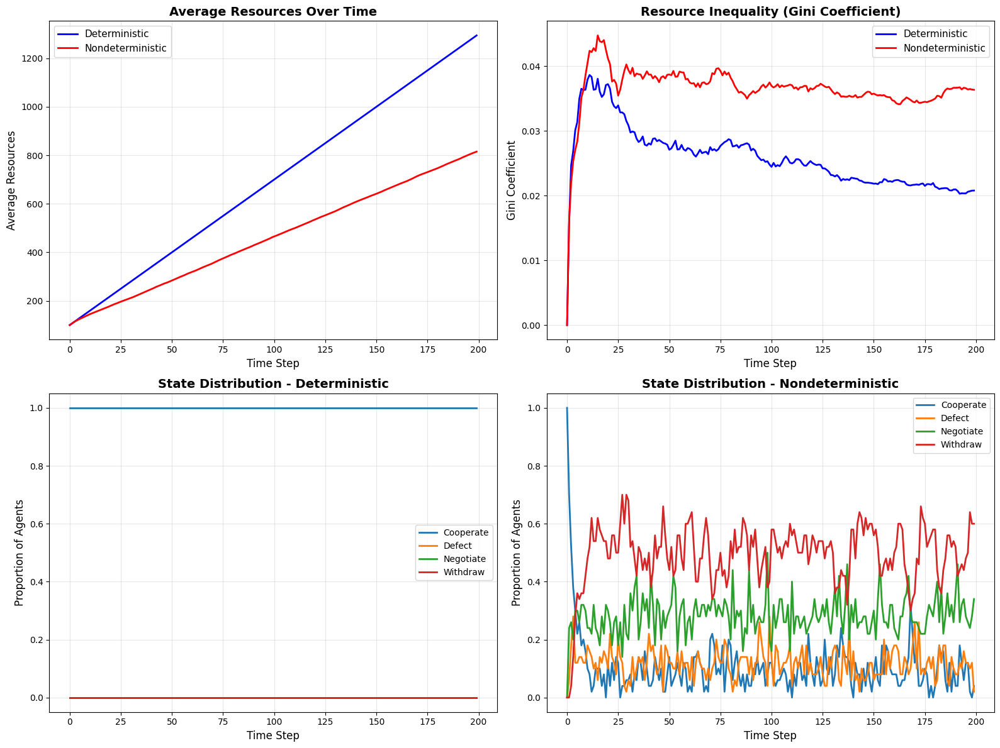

Saved visualization as simulation_results.png


In [8]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Average Resources Over Time
axes[0, 0].plot(det_data['Average_Resources'], label='Deterministic', linewidth=2, color='blue')
axes[0, 0].plot(nondet_data['Average_Resources'], label='Nondeterministic', linewidth=2, color='red')
axes[0, 0].set_xlabel('Time Step', fontsize=12)
axes[0, 0].set_ylabel('Average Resources', fontsize=12)
axes[0, 0].set_title('Average Resources Over Time', fontsize=14, fontweight='bold')
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Gini Coefficient (Inequality)
axes[0, 1].plot(det_data['Gini_Coefficient'], label='Deterministic', linewidth=2, color='blue')
axes[0, 1].plot(nondet_data['Gini_Coefficient'], label='Nondeterministic', linewidth=2, color='red')
axes[0, 1].set_xlabel('Time Step', fontsize=12)
axes[0, 1].set_ylabel('Gini Coefficient', fontsize=12)
axes[0, 1].set_title('Resource Inequality (Gini Coefficient)', fontsize=14, fontweight='bold')
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: State Distribution - Deterministic
axes[1, 0].plot(det_data['Cooperation_Rate'], label='Cooperate', linewidth=2)
axes[1, 0].plot(det_data['Defection_Rate'], label='Defect', linewidth=2)
axes[1, 0].plot(det_data['Negotiation_Rate'], label='Negotiate', linewidth=2)
axes[1, 0].plot(det_data['Withdrawal_Rate'], label='Withdraw', linewidth=2)
axes[1, 0].set_xlabel('Time Step', fontsize=12)
axes[1, 0].set_ylabel('Proportion of Agents', fontsize=12)
axes[1, 0].set_title('State Distribution - Deterministic', fontsize=14, fontweight='bold')
axes[1, 0].legend(fontsize=10)
axes[1, 0].grid(True, alpha=0.3)

# Plot 4: State Distribution - Nondeterministic
axes[1, 1].plot(nondet_data['Cooperation_Rate'], label='Cooperate', linewidth=2)
axes[1, 1].plot(nondet_data['Defection_Rate'], label='Defect', linewidth=2)
axes[1, 1].plot(nondet_data['Negotiation_Rate'], label='Negotiate', linewidth=2)
axes[1, 1].plot(nondet_data['Withdrawal_Rate'], label='Withdraw', linewidth=2)
axes[1, 1].set_xlabel('Time Step', fontsize=12)
axes[1, 1].set_ylabel('Proportion of Agents', fontsize=12)
axes[1, 1].set_title('State Distribution - Nondeterministic', fontsize=14, fontweight='bold')
axes[1, 1].legend(fontsize=10)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('simulation_results.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved visualization as simulation_results.png")

Additional Analysis - Summary Statistics

In [9]:
print("\n" + "="*60)
print("SUMMARY STATISTICS")
print("="*60)

print("\n--- DETERMINISTIC MODEL ---")
print(f"Final Average Resources: {det_data['Average_Resources'].iloc[-1]:.2f}")
print(f"Final Gini Coefficient: {det_data['Gini_Coefficient'].iloc[-1]:.4f}")
print(f"Final Cooperation Rate: {det_data['Cooperation_Rate'].iloc[-1]:.2%}")
print(f"Final Defection Rate: {det_data['Defection_Rate'].iloc[-1]:.2%}")

print("\n--- NONDETERMINISTIC MODEL ---")
print(f"Final Average Resources: {nondet_data['Average_Resources'].iloc[-1]:.2f}")
print(f"Final Gini Coefficient: {nondet_data['Gini_Coefficient'].iloc[-1]:.4f}")
print(f"Final Cooperation Rate: {nondet_data['Cooperation_Rate'].iloc[-1]:.2%}")
print(f"Final Defection Rate: {nondet_data['Defection_Rate'].iloc[-1]:.2%}")

print("\n--- DIFFERENCES ---")
resource_diff = nondet_data['Average_Resources'].iloc[-1] - det_data['Average_Resources'].iloc[-1]
gini_diff = nondet_data['Gini_Coefficient'].iloc[-1] - det_data['Gini_Coefficient'].iloc[-1]
coop_diff = nondet_data['Cooperation_Rate'].iloc[-1] - det_data['Cooperation_Rate'].iloc[-1]

print(f"Resource Difference: {resource_diff:+.2f}")
print(f"Gini Difference: {gini_diff:+.4f}")
print(f"Cooperation Rate Difference: {coop_diff:+.2%}")


SUMMARY STATISTICS

--- DETERMINISTIC MODEL ---
Final Average Resources: 1294.00
Final Gini Coefficient: 0.0208
Final Cooperation Rate: 100.00%
Final Defection Rate: 0.00%

--- NONDETERMINISTIC MODEL ---
Final Average Resources: 815.06
Final Gini Coefficient: 0.0363
Final Cooperation Rate: 4.00%
Final Defection Rate: 2.00%

--- DIFFERENCES ---
Resource Difference: -478.94
Gini Difference: +0.0156
Cooperation Rate Difference: -96.00%


Create Spatial Layout for Visualization

In [10]:
class SpatialMarketModel(mesa.Model):
    """Market simulation model with spatial layout for visualization"""

    def __init__(self, n_agents=30, use_nondeterministic=True, width=10, height=10):
        super().__init__()
        self.num_agents = n_agents
        self.use_nondeterministic = use_nondeterministic
        self.width = width
        self.height = height

        # Create grid for spatial positions
        self.grid = mesa.space.MultiGrid(width, height, torus=True)

        # Create agents with random positions
        for i in range(self.num_agents):
            risk_tolerance = np.random.uniform(0.2, 0.8)
            agent = MarketAgent(self, initial_resources=100, risk_tolerance=risk_tolerance)

            # Place agent at random position
            x = np.random.randint(0, width)
            y = np.random.randint(0, height)
            self.grid.place_agent(agent, (x, y))

        # Data collection
        self.datacollector = mesa.DataCollector(
            model_reporters={
                "Average_Resources": lambda m: np.mean([a.resources for a in m.agents]),
                "Gini_Coefficient": lambda m: self.calculate_gini([a.resources for a in m.agents]),
                "Cooperation_Rate": lambda m: sum(1 for a in m.agents if a.state == State.COOPERATE) / m.num_agents,
                "Defection_Rate": lambda m: sum(1 for a in m.agents if a.state == State.DEFECT) / m.num_agents,
            },
            agent_reporters={
                "Resources": "resources",
                "State": "state"
            }
        )

    @staticmethod
    def calculate_gini(resources):
        """Calculate Gini coefficient for resource inequality"""
        sorted_resources = np.array(sorted(resources))
        n = len(sorted_resources)
        index = np.arange(1, n + 1)
        return (2 * np.sum(index * sorted_resources)) / (n * np.sum(sorted_resources)) - (n + 1) / n

    def step(self):
        """Advance model by one step"""
        self.datacollector.collect(self)
        self.agents.shuffle_do("step")

Run Spatial Simulation for Visualization

In [11]:
print("Running spatial simulation for visualization...")
spatial_model = SpatialMarketModel(n_agents=30, use_nondeterministic=True, width=10, height=10)

# Store model snapshots for animation
simulation_steps = 100
model_snapshots = []

for step in range(simulation_steps):
    spatial_model.step()
    # Create snapshot of current state
    snapshot = {
        'step': step,
        'positions': [(agent.pos, agent.state, agent.resources) for agent in spatial_model.agents],
        'avg_resources': np.mean([a.resources for a in spatial_model.agents]),
        'coop_rate': sum(1 for a in spatial_model.agents if a.state == State.COOPERATE) / spatial_model.num_agents
    }
    model_snapshots.append(snapshot)

print(f"Simulation complete! {simulation_steps} frames captured.")

Running spatial simulation for visualization...
Simulation complete! 100 frames captured.


Animate Agent Interactions - Video Visualization

Creating animation... this may take a moment.


Animation complete! Watch the agents interact in real-time.

Color Legend:
  🟢 Green  = COOPERATE
  🔴 Red    = DEFECT
  🟠 Orange = NEGOTIATE
  🟣 Purple = WITHDRAW

Note: Agents randomly move around the 10×10 grid each step


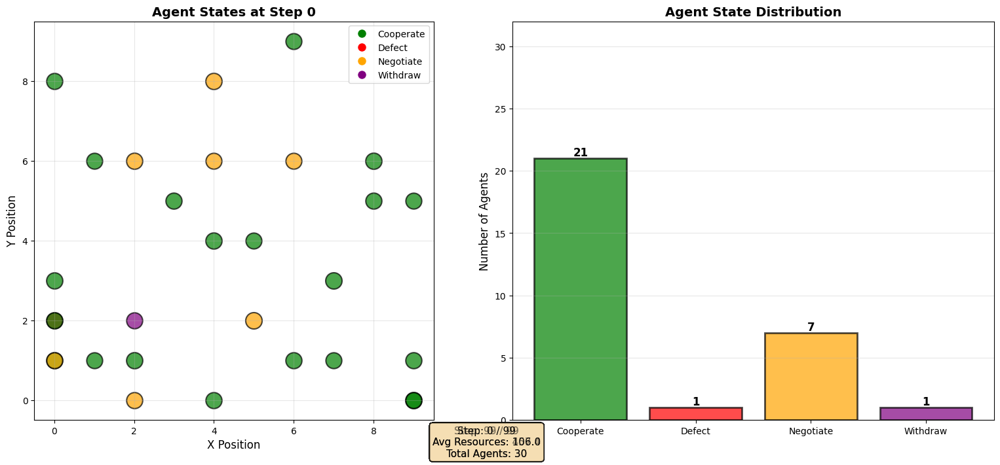

In [12]:
state_colors = {
    State.COOPERATE: 'green',
    State.DEFECT: 'red',
    State.NEGOTIATE: 'orange',
    State.WITHDRAW: 'purple'
}

# Create figure for animation
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

def animate(frame):
    """Animation function"""
    snapshot = model_snapshots[frame]

    # Clear axes
    axes[0].clear()
    axes[1].clear()

    # --- LEFT PANEL: Agent Spatial Visualization ---
    ax_spatial = axes[0]
    ax_spatial.set_xlim(-0.5, spatial_model.width - 0.5)
    ax_spatial.set_ylim(-0.5, spatial_model.height - 0.5)
    ax_spatial.set_aspect('equal')
    ax_spatial.set_title(f'Agent States at Step {frame}', fontsize=14, fontweight='bold')
    ax_spatial.set_xlabel('X Position', fontsize=12)
    ax_spatial.set_ylabel('Y Position', fontsize=12)
    ax_spatial.grid(True, alpha=0.3)

    # Plot agents as colored dots
    for pos, state, resources in snapshot['positions']:
        color = state_colors[state]
        size = 100 + (resources / 100) * 200  # Size based on resources
        ax_spatial.scatter(pos[0], pos[1], s=size, c=color, alpha=0.7, edgecolors='black', linewidth=1.5)

    # Add legend
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Cooperate'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Defect'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Negotiate'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='Withdraw')
    ]
    ax_spatial.legend(handles=legend_elements, loc='upper right', fontsize=10)

    # --- RIGHT PANEL: State Distribution Bar Chart ---
    ax_metrics = axes[1]
    ax_metrics.set_title('Agent State Distribution', fontsize=14, fontweight='bold')

    # Count agents in each state
    state_counts = {
        'Cooperate': 0,
        'Defect': 0,
        'Negotiate': 0,
        'Withdraw': 0
    }

    for pos, state, resources in snapshot['positions']:
        if state == State.COOPERATE:
            state_counts['Cooperate'] += 1
        elif state == State.DEFECT:
            state_counts['Defect'] += 1
        elif state == State.NEGOTIATE:
            state_counts['Negotiate'] += 1
        elif state == State.WITHDRAW:
            state_counts['Withdraw'] += 1

    # Create bar chart
    states = list(state_counts.keys())
    counts = list(state_counts.values())
    colors_list = ['green', 'red', 'orange', 'purple']

    bars = ax_metrics.bar(states, counts, color=colors_list, alpha=0.7, edgecolor='black', linewidth=2)
    ax_metrics.set_ylabel('Number of Agents', fontsize=12)
    ax_metrics.set_ylim(0, spatial_model.num_agents + 2)
    ax_metrics.grid(True, alpha=0.3, axis='y')

    # Add count labels on bars
    for bar in bars:
        height = bar.get_height()
        ax_metrics.text(bar.get_x() + bar.get_width()/2., height,
                       f'{int(height)}',
                       ha='center', va='bottom', fontsize=12, fontweight='bold')

    # Add text info
    info_text = f"Step: {frame} / {simulation_steps-1}\nAvg Resources: {snapshot['avg_resources']:.1f}\nTotal Agents: {spatial_model.num_agents}"
    fig.text(0.5, 0.02, info_text, ha='center', fontsize=11, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Create animation
print("Creating animation... this may take a moment.")
anim = animation.FuncAnimation(fig, animate, frames=len(model_snapshots),
                               interval=200, repeat=True, blit=False)

plt.tight_layout()
plt.subplots_adjust(bottom=0.1)
from IPython.display import HTML
display(HTML(anim.to_jshtml()))

print("Animation complete! Watch the agents interact in real-time.")
print("\nColor Legend:")
print("  🟢 Green  = COOPERATE")
print("  🔴 Red    = DEFECT")
print("  🟠 Orange = NEGOTIATE")
print("  🟣 Purple = WITHDRAW")
print("\nNote: Agents randomly move around the 10×10 grid each step")

COMPLETE ANALYSIS CELL


In [18]:
print("="*70)
print("COMPREHENSIVE SIMULATION RESULTS")
print("="*70)

print("\n--- EXPERIMENT PARAMETERS ---")
print("Deterministic Model: 50 agents, 200 timesteps")
print("Nondeterministic Model: 50 agents, 200 timesteps")
print("Spatial Visualization: 30 agents, 100 timesteps, 10x10 grid")

print("\n--- INITIAL STATE (T=0) ---")
print(f"Initial Avg Resources (DET): {det_data['Average_Resources'].iloc[0]:.2f}")
print(f"Initial Avg Resources (NONDET): {nondet_data['Average_Resources'].iloc[0]:.2f}")
print(f"Initial Gini (DET): {det_data['Gini_Coefficient'].iloc[0]:.4f}")
print(f"Initial Gini (NONDET): {nondet_data['Gini_Coefficient'].iloc[0]:.4f}")

print("\n--- FINAL STATE (T=200) ---")
print("DETERMINISTIC:")
print(f"  Average Resources: {det_data['Average_Resources'].iloc[-1]:.2f}")
print(f"  Gini Coefficient: {det_data['Gini_Coefficient'].iloc[-1]:.4f}")
print(f"  Cooperation: {det_data['Cooperation_Rate'].iloc[-1]:.2%}")
print(f"  Defection: {det_data['Defection_Rate'].iloc[-1]:.2%}")
print(f"  Negotiation: {det_data['Negotiation_Rate'].iloc[-1]:.2%}")
print(f"  Withdrawal: {det_data['Withdrawal_Rate'].iloc[-1]:.2%}")

print("\nNONDETERMINISTIC:")
print(f"  Average Resources: {nondet_data['Average_Resources'].iloc[-1]:.2f}")
print(f"  Gini Coefficient: {nondet_data['Gini_Coefficient'].iloc[-1]:.4f}")
print(f"  Cooperation: {nondet_data['Cooperation_Rate'].iloc[-1]:.2%}")
print(f"  Defection: {nondet_data['Defection_Rate'].iloc[-1]:.2%}")
print(f"  Negotiation: {nondet_data['Negotiation_Rate'].iloc[-1]:.2%}")
print(f"  Withdrawal: {nondet_data['Withdrawal_Rate'].iloc[-1]:.2%}")

print("\n--- TRAJECTORY STATISTICS ---")
det_resources = det_data['Average_Resources'].values
nondet_resources = nondet_data['Average_Resources'].values
print(f"Deterministic Resource Volatility (Std Dev): {np.std(det_resources):.2f}")
print(f"Nondeterministic Resource Volatility (Std Dev): {np.std(nondet_resources):.2f}")
print(f"Deterministic Resource Range: {det_resources.min():.2f} to {det_resources.max():.2f}")
print(f"Nondeterministic Resource Range: {nondet_resources.min():.2f} to {nondet_resources.max():.2f}")

print("\n--- COOPERATION DYNAMICS ---")
print(f"Deterministic Avg Cooperation (entire run): {np.mean(det_data['Cooperation_Rate'].values):.4f}")
print(f"Nondeterministic Avg Cooperation (entire run): {np.mean(nondet_data['Cooperation_Rate'].values):.4f}")

final_snapshot = model_snapshots[-1]
state_distribution = {
    'Cooperate': sum(1 for _, state, _ in final_snapshot['positions'] if state == State.COOPERATE),
    'Defect': sum(1 for _, state, _ in final_snapshot['positions'] if state == State.DEFECT),
    'Negotiate': sum(1 for _, state, _ in final_snapshot['positions'] if state == State.NEGOTIATE),
    'Withdraw': sum(1 for _, state, _ in final_snapshot['positions'] if state == State.WITHDRAW),
}

print("\n--- SPATIAL MODEL FINAL DISTRIBUTION ---")
for state, count in state_distribution.items():
    print(f"{state}: {count} ({count/30*100:.1f}%)")
print(f"Final Average Resources: {final_snapshot['avg_resources']:.2f}")
print(f"Final Cooperation Rate: {final_snapshot['coop_rate']:.2%}")

COMPREHENSIVE SIMULATION RESULTS

--- EXPERIMENT PARAMETERS ---
Deterministic Model: 50 agents, 200 timesteps
Nondeterministic Model: 50 agents, 200 timesteps
Spatial Visualization: 30 agents, 100 timesteps, 10x10 grid

--- INITIAL STATE (T=0) ---
Initial Avg Resources (DET): 100.00
Initial Avg Resources (NONDET): 100.00
Initial Gini (DET): 0.0000
Initial Gini (NONDET): 0.0000

--- FINAL STATE (T=200) ---
DETERMINISTIC:
  Average Resources: 1294.00
  Gini Coefficient: 0.0208
  Cooperation: 100.00%
  Defection: 0.00%
  Negotiation: 0.00%
  Withdrawal: 0.00%

NONDETERMINISTIC:
  Average Resources: 815.06
  Gini Coefficient: 0.0363
  Cooperation: 4.00%
  Defection: 2.00%
  Negotiation: 34.00%
  Withdrawal: 60.00%

--- TRAJECTORY STATISTICS ---
Deterministic Resource Volatility (Std Dev): 346.41
Nondeterministic Resource Volatility (Std Dev): 205.80
Deterministic Resource Range: 100.00 to 1294.00
Nondeterministic Resource Range: 100.00 to 815.06

--- COOPERATION DYNAMICS ---
Deterministic 

Save Animation as MP4 Video

In [13]:
print("\nSaving animation to video file...")

# Recreate figure for saving
fig_save, axes_save = plt.subplots(1, 2, figsize=(16, 7))

def animate_for_save(frame):
    """Animation function for saving"""
    snapshot = model_snapshots[frame]

    axes_save[0].clear()
    axes_save[1].clear()

    # --- LEFT PANEL: Agent Spatial Visualization ---
    ax_spatial = axes_save[0]
    ax_spatial.set_xlim(-0.5, spatial_model.width - 0.5)
    ax_spatial.set_ylim(-0.5, spatial_model.height - 0.5)
    ax_spatial.set_aspect('equal')
    ax_spatial.set_title(f'Agent States at Step {frame}', fontsize=14, fontweight='bold')
    ax_spatial.set_xlabel('X Position', fontsize=12)
    ax_spatial.set_ylabel('Y Position', fontsize=12)
    ax_spatial.grid(True, alpha=0.3)

    # Plot agents as colored dots
    for pos, state, resources in snapshot['positions']:
        color = state_colors[state]
        size = 100 + (resources / 100) * 200
        ax_spatial.scatter(pos[0], pos[1], s=size, c=color, alpha=0.7, edgecolors='black', linewidth=1.5)

    # Add legend
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Cooperate'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Defect'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Negotiate'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='Withdraw')
    ]
    ax_spatial.legend(handles=legend_elements, loc='upper right', fontsize=10)

    # --- RIGHT PANEL: Metrics Over Time ---
    ax_metrics = axes_save[1]
    ax_metrics.set_title('Emergent Metrics', fontsize=14, fontweight='bold')
    ax_metrics.set_xlabel('Time Step', fontsize=12)
    ax_metrics.set_ylabel('Value', fontsize=12)

    steps_so_far = [s['step'] for s in model_snapshots[:frame+1]]
    avg_resources_so_far = [s['avg_resources'] for s in model_snapshots[:frame+1]]
    coop_rate_so_far = [s['coop_rate'] for s in model_snapshots[:frame+1]]

    ax_metrics.plot(steps_so_far, avg_resources_so_far, 'b-', linewidth=2, label='Avg Resources')
    ax_metrics.plot(steps_so_far, [x * 150 for x in coop_rate_so_far], 'g-', linewidth=2, label='Cooperation Rate (×150)')
    ax_metrics.set_xlim(0, simulation_steps)
    ax_metrics.set_ylim(50, 200)
    ax_metrics.legend(fontsize=10)
    ax_metrics.grid(True, alpha=0.3)

    info_text = f"Step: {frame}\nAvg Resources: {snapshot['avg_resources']:.1f}\nCooperation: {snapshot['coop_rate']:.1%}"
    fig_save.text(0.5, 0.02, info_text, ha='center', fontsize=11, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Create and save animation
anim_save = animation.FuncAnimation(fig_save, animate_for_save, frames=len(model_snapshots),
                                     interval=200, repeat=True, blit=False)

# Save as MP4 video
try:
    Writer = animation.writers['ffmpeg']
    writer = Writer(fps=5, bitrate=1800)
    anim_save.save('nfa_market_simulation.mp4', writer=writer)
    print("✓ Video saved successfully as 'nfa_market_simulation.mp4'")
except Exception as e:
    print(f"⚠ MP4 save failed ({e}). Trying GIF format instead...")
    try:
        anim_save.save('nfa_market_simulation.gif', writer='pillow')
        print("✓ Animation saved successfully as 'nfa_market_simulation.gif'")
    except Exception as e2:
        print(f"⚠ GIF save also failed: {e2}")

plt.close(fig_save)


Saving animation to video file...
✓ Video saved successfully as 'nfa_market_simulation.mp4'


Download Video from Google Colab (Only if you're running on Google colab)
#This is an optional step

In [14]:
''' from google.colab import files

print("\nDownloading animation file...")
try:
    # Try to download MP4 if it exists
    files.download('nfa_market_simulation.mp4')
    print("✓ MP4 video downloaded!")
except FileNotFoundError:
    try:
        # Fall back to GIF if MP4 doesn't exist
        files.download('nfa_market_simulation.gif')
        print("✓ GIF animation downloaded!")
    except FileNotFoundError:
        print("⚠ No animation file found. Check previous cell for errors.") '''

' from google.colab import files\n\nprint("\nDownloading animation file...")\ntry:\n    # Try to download MP4 if it exists\n    files.download(\'nfa_market_simulation.mp4\')\n    print("✓ MP4 video downloaded!")\nexcept FileNotFoundError:\n    try:\n        # Fall back to GIF if MP4 doesn\'t exist\n        files.download(\'nfa_market_simulation.gif\')\n        print("✓ GIF animation downloaded!")\n    except FileNotFoundError:\n        print("⚠ No animation file found. Check previous cell for errors.") '